# General Notes for this DataFrame and Criteria for It 
## THIS VERSION OF THE DATASET DOES NOT HAVE EVCAR2B, so the dataset is larger.

#There is a Jupyter notebook that thoroughly describes the data extraction, cleaning, and 
#transformation process, and the cleaned data is exported as CSV files for the machine learning model. (10 points)

#A Python script initializes, trains, and evaluates a model or loads a pretrained model. (10 points)

#The model demonstrates meaningful predictive power at least 75% classification accuracy or 0.80 R-squared. (5 points)



# Data Implementation:  Data Cleaning and Preparation

In [1]:
#Setup dependencies and create encoder and standardscaler instances

import pandas as pd
import numpy as np
import scipy.stats as stats

import matplotlib.pyplot as plt
%matplotlib inline
import pydotplus
import seaborn as sns
import graphviz


from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse=False) 

from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import LeaveOneOut
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC 

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report

from IPython.display import Image





In [2]:
#This is to turn on and off depending on whether you want to see warnings or not.
import warnings
warnings.filterwarnings('ignore')

In [3]:
path ='../Data/'

In [4]:


EV_df_original_1B = pd.read_csv(path+'ATP_108_Original_csv')

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10282 entries, 0 to 10281
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 10282 non-null  int64  
 1   ENV2_a_W108          10282 non-null  int64  
 2   ENV2_b_W108          10282 non-null  int64  
 3   ENV2_d_W108          10282 non-null  int64  
 4   ENV2_f_W108          10282 non-null  int64  
 5   EN1_W108             10282 non-null  int64  
 6   EVCAR2_W108          10282 non-null  int64  
 7   EVCAR3_W108          10282 non-null  int64  
 8   EVCAR1_W108          10282 non-null  int64  
 9   ENVIR8_a_W108        10282 non-null  int64  
 10  ENVIR8_e_W108        10282 non-null  int64  
 11  LOCENV_a_W108        10282 non-null  int64  
 12  LOCENV_d_W108        10282 non-null  int64  
 13  LOCENV_e_W108        10282 non-null  int64  
 14  ENVRMPCT_a_W108      10282 non-null  int64  
 15  ENVRMPCT_b_W108      10282 non-null 

In [5]:
# look at data frame
EV_df_original_1B.head()


,QKEY,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,...,F_METRO,F_CREGION,F_AGECAT,F_GENDER,F_EDUCCAT,F_RACETHNMOD,F_PARTYSUM_FINAL,F_INC_SDT1,F_IDEO,F_INTFREQ
0,100260,1,1,2,2,2,2,2,2,2,...,1,4,4,1,1,1,1,4,1,2.0
1,100314,2,1,1,1,1,2,1,2,2,...,2,2,4,1,2,1,1,3,4,2.0
2,100363,1,1,1,1,1,2,2,2,2,...,1,1,2,2,1,1,2,9,3,2.0
3,100598,2,2,1,1,1,2,1,2,2,...,1,4,3,2,1,1,1,9,2,2.0
4,100637,1,1,1,1,2,3,2,2,1,...,1,3,4,2,2,1,1,2,1,5.0


In [6]:
# list name of columns so just copy the output for later if and when we need for coding
print(EV_df_original_1B.columns.tolist())

['QKEY', 'ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_MARITAL', 'F_METRO', 'F_CREGION', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_RACETHNMOD', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ']


In [7]:
# determine # of nulls
EV_df_original_1B.isnull().sum()

QKEY                     0
ENV2_a_W108              0
ENV2_b_W108              0
ENV2_d_W108              0
ENV2_f_W108              0
EN1_W108                 0
EVCAR2_W108              0
EVCAR3_W108              0
EVCAR1_W108              0
ENVIR8_a_W108            0
ENVIR8_e_W108            0
LOCENV_a_W108            0
LOCENV_d_W108            0
LOCENV_e_W108            0
ENVRMPCT_a_W108          0
ENVRMPCT_b_W108          0
ENVRMPCT_c_W108          0
ENVRMPCT_d_W108          0
ENVRMPCT_e_W108          0
CCPOLICY_e_W108          0
RSTCWRK_a_W108           0
RSTCWRK_b_W108           0
RSTCWRK_c_W108           0
RSTCWRK_d_W108           0
RSTCWRK_e_W108           0
COVID_INFECT_a_W108      0
COVID_INFECT_b_W108      0
GAP21Q12_W108            0
F_MARITAL                0
F_METRO                  0
F_CREGION                0
F_AGECAT                 0
F_GENDER                 0
F_EDUCCAT                0
F_RACETHNMOD             0
F_PARTYSUM_FINAL         0
F_INC_SDT1               0
F

In [8]:
#Returns duplicated rows

EV_df_original_1B[EV_df_original_1B.duplicated()]

,QKEY,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,...,F_METRO,F_CREGION,F_AGECAT,F_GENDER,F_EDUCCAT,F_RACETHNMOD,F_PARTYSUM_FINAL,F_INC_SDT1,F_IDEO,F_INTFREQ


In [9]:
#For 1B dataframe, drop all 99s (that are converted to nulls, first).  Also drop all NAs.
EV_df_original_1B[:] = np.where(EV_df_original_1B == 99, np.nan, EV_df_original_1B)
EV_df_original_1B.dropna(inplace = True)
EV_df_original_1B.reset_index()
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [10]:
#Recode features with Favor and Oppose responses so Favor =1 and Oppose=0
EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']] = EV_df_original_1B[['ENV2_a_W108','ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108','EVCAR3_W108', 'CCPOLICY_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [11]:
#Recode features with Yes and No responses so Yes=1 and No=0; ***EVCAR1_W108 may be imbalanced***
EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']] = EV_df_original_1B[['EVCAR1_W108','ENVRMPCT_a_W108','ENVRMPCT_b_W108','ENVRMPCT_c_W108','ENVRMPCT_d_W108','ENVRMPCT_e_W108']].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [12]:
#Recode feature with 1= "Expand alt.energy" support and 2= "Expand fossil fuels" responses so 2=0 and 1=1
EV_df_original_1B['EN1_W108'] = EV_df_original_1B['EN1_W108'].replace([2, 1], [0, 1])

EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

In [13]:
#Reverse features so a higher label (i.e., most, all, very) is a higher numeric score. Converted binary features to 0 and 1 values.
#for clarity of interpretation and explanation.  We tried the OrdinalEncoding but the original scales for these features 
#not in a meaningful order, so we opted to use the replace function.  For clarity of interpretation
#and explanation, all oridinal variables/questions/items with a 0 value indicated by their label 
#in the questionnaire were recoded to reflect a 0 value. 
#Also, for EVCAR2_W108, designate 5 as missing data given 0 value will be recoded as 0 ---- not a 1
# EV_df_original_1B['EVCAR2_W108'] = EV_df_original_1B['EVCAR2_W108'].replace({1: 3, 2: 2, 3: 1, 4: 0})

EV_df_original_1B[['GAP21Q12_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']] = EV_df_original_1B[['GAP21Q12_W108','LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B['F_EDUCCAT'] = EV_df_original_1B['F_EDUCCAT'].replace([1, 2, 3], [3, 2, 1])

# EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']] = EV_df_original_1B[['EVCAR2B_a_W108','EVCAR2B_b_W108','EVCAR2B_c_W108']].replace([1, 2, 3], [2, 1, 0])

EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']] = EV_df_original_1B[['COVID_INFECT_a_W108', 'COVID_INFECT_b_W108']].replace([1, 2, 3, 4], [3, 2, 1, 0])

EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']] = EV_df_original_1B[['RSTCWRK_a_W108','RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108']].replace([1, 2, 3, 4, 5], [4, 3, 2, 1, 0])

EV_df_original_1B['F_INTFREQ'] = EV_df_original_1B['F_INTFREQ'].replace([5, 4, 3, 2, 1], [1, 2, 3, 4, 5])

EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']] = EV_df_original_1B[['ENVIR8_a_W108','ENVIR8_e_W108']].replace([1, 2, 3], [3, 1, 2])

EV_df_original_1B[['F_METRO','F_GENDER']] = EV_df_original_1B[['F_METRO','F_GENDER']].replace([1, 2], [1, 0])

EV_df_original_1B.info()

EV_df_original_1B['EVCAR2_W108'].value_counts()

<class 'pandas.core.frame.DataFrame'>
Index: 8684 entries, 0 to 10280
Data columns (total 39 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   float

EVCAR2_W108
2.0    2188
4.0    1996
3.0    1920
1.0    1745
5.0     835
Name: count, dtype: int64

In [14]:
##Reset index
#The reset_index() function is used to reset the index of the DataFrame. 
#The inplace=True argument means that the change is made directly in the original DataFrame, 
#without creating a new DataFrame.
#The drop=True argument means that the old index is completely discarded

EV_df_original_1B.reset_index(inplace=True,drop=True)

In [15]:
#OneHotEncode(r) these features to break out nominal values and creat dummy variables.
#They are broken out and not treated as ordinal because someone who is married is not better/higher in value than
#a single person, and a someone in the Southeast is not more valuable than someone in the Northwest, and so on.

# List of columns to encode
columns_to_encode = ['F_MARITAL', 'F_CREGION', 'F_RACETHNMOD']

# Fit and transform the encoder on the columns
encoded = encoder.fit_transform(EV_df_original_1B[columns_to_encode])

# # Get feature names
feature_names = encoder.get_feature_names_out(columns_to_encode)

# Create a DataFrame with the encoded data
encoded_df = pd.DataFrame(encoded, columns=feature_names)

# Drop the original columns from the DataFrame
EV_df_original_1B = EV_df_original_1B.drop(columns_to_encode, axis=1)


In [16]:
# Concatenate the original DataFrame with the one-hot encoded DataFrame
EV_df_original_1B = pd.concat([EV_df_original_1B, encoded_df], axis=1)
EV_df_original_1B.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8684 entries, 0 to 8683
Data columns (total 51 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   QKEY                 8684 non-null   int64  
 1   ENV2_a_W108          8684 non-null   float64
 2   ENV2_b_W108          8684 non-null   float64
 3   ENV2_d_W108          8684 non-null   float64
 4   ENV2_f_W108          8684 non-null   float64
 5   EN1_W108             8684 non-null   float64
 6   EVCAR2_W108          8684 non-null   float64
 7   EVCAR3_W108          8684 non-null   float64
 8   EVCAR1_W108          8684 non-null   float64
 9   ENVIR8_a_W108        8684 non-null   float64
 10  ENVIR8_e_W108        8684 non-null   float64
 11  LOCENV_a_W108        8684 non-null   float64
 12  LOCENV_d_W108        8684 non-null   float64
 13  LOCENV_e_W108        8684 non-null   float64
 14  ENVRMPCT_a_W108      8684 non-null   float64
 15  ENVRMPCT_b_W108      8684 non-null   f

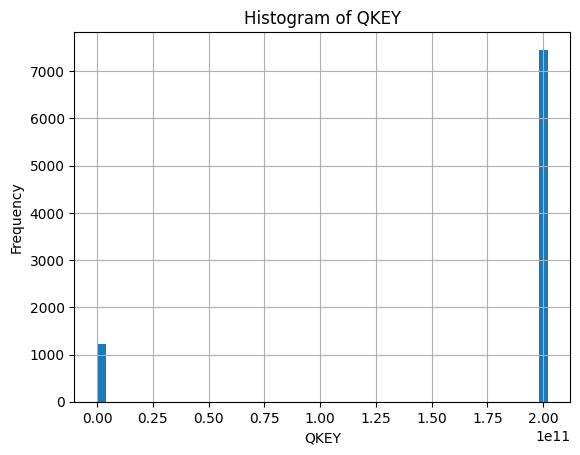

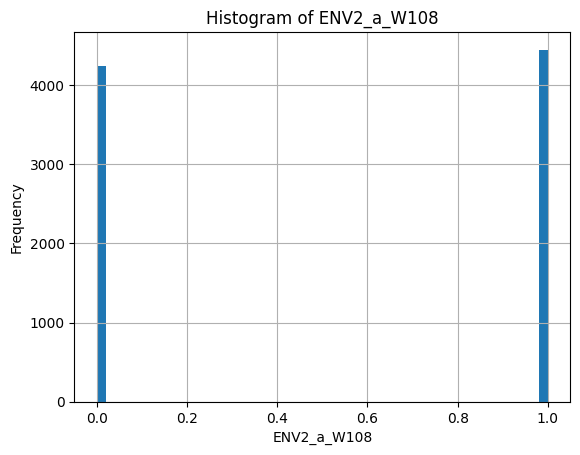

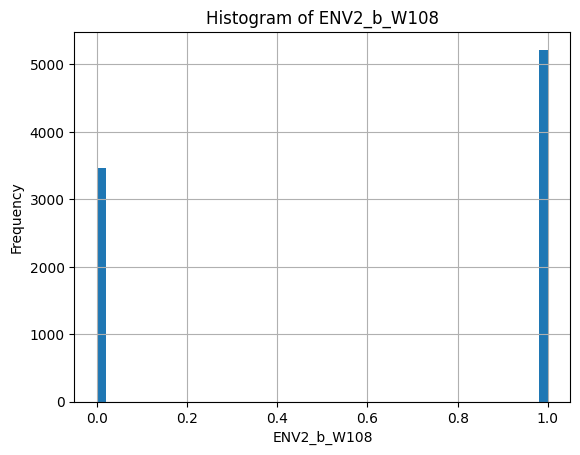

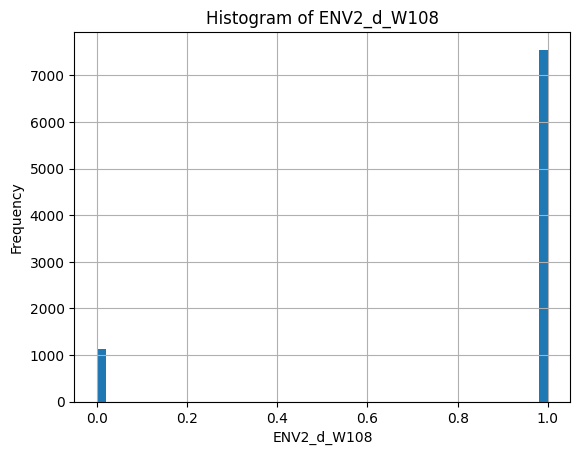

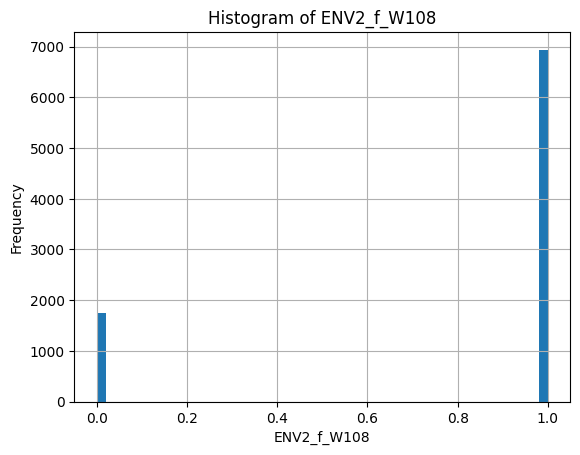

...

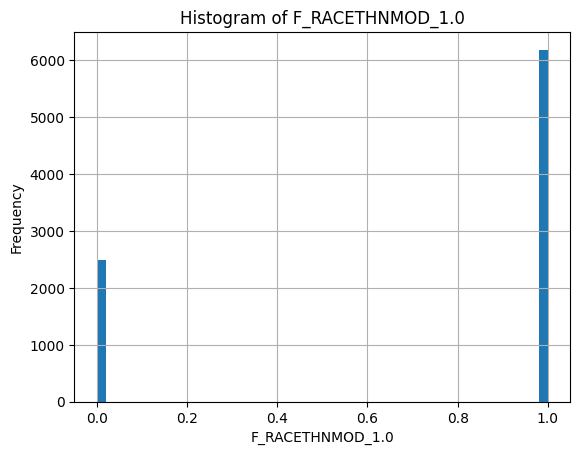

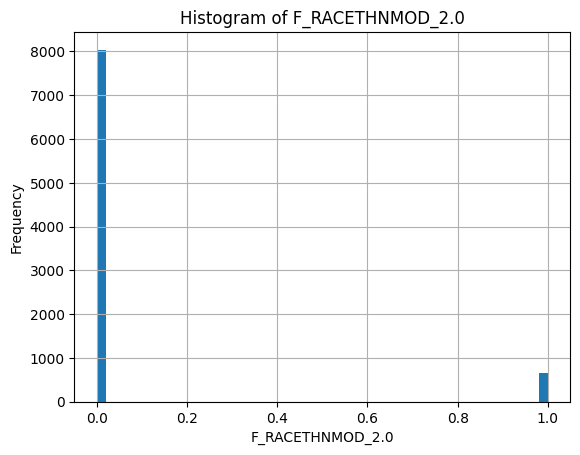

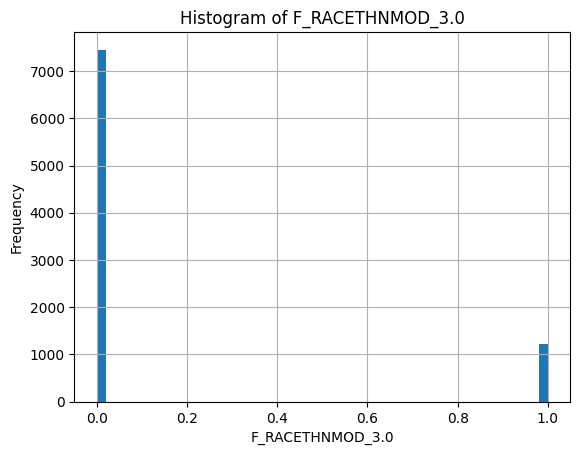

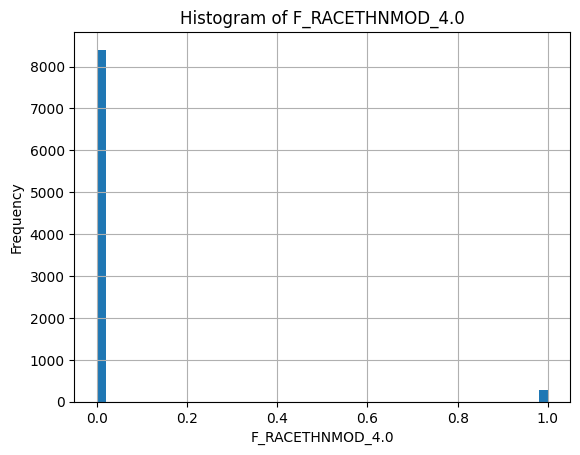

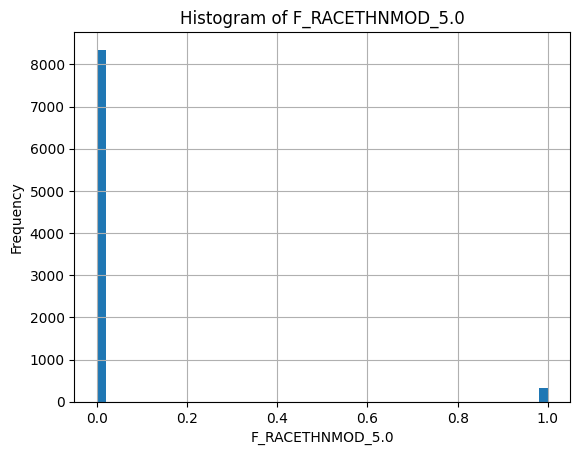

In [17]:
#Initial look at values and distributions with histograms.  Accuracy in recoding?  Imbalances? Eyeshot decent distributions for ordinal data?

for column in EV_df_original_1B:
    plt.figure()  # create a new figure
    EV_df_original_1B[column].hist(bins=50)  # create a histogram for the current column
    plt.title('Histogram of ' + column)  # set the title
    plt.xlabel(column)  # set the x-label
    plt.ylabel('Frequency')  # set the y-label

plt.show()

# Data Implementation:  Exploratory Data Analysis and Continued Data Preparation
## Analyses to refine feature evaluation, importance, and selection prior to model selection and evaluation

In [18]:
#EDA ... to guide our model selection...

#Target selection and testing (including feature independence - correlation and VIF):

#EVCAR2 Next time buy a car... (linear regression, SVC, )... to include EVCAR1 as independent variable
#-Looks like it is a pretty normal distribution
#-We can test the normality with: 
    #Perform the normality test
    #k2, p = stats.normaltest(df['data'])
    #alpha = 0.05
    #See what correlates with it  
    #VIF
    
    
#******THE FOLLOWING POTENTIAL OUTCOME VARIABLES CAN HAVE EVCAR2 AS A PREDICTOR IN CLASSIFICATION MODELS******#    
    
#EVCAR3 - Favor production of new gasoline cars and trucks by 2035 (Logistic regression?)
#-This one is fairly balanced 
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

#CCPOLICYe - Agree with incentives for evs to combat climate change
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?   

#EN1 Priority - traditional versus alternative (classification outcome? Unexpected finding?)
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

#EVCAR1 - Do you have one or not (resampling as a strategy?)
#-Imbalanced based on histogram but... there are ways for us to handle that
    #-See What things correlate with it
    #-VIF
    #-RFC 
    #Going forward should we do some resampling or SVC, XGBoost, SMOTE, or ... is it ok?
    

    


#Which features to "deselect" 
#What to anticipate with our data under certain models.
#Is our question more interested in balanced accuracy and/or AUC ROC curve...  sensitivity, precision
    
###--------APPENDICES--------------------------------------------------------
    #Feature interdependence and importance -  correlations with target and multicollinearity
    #Multi-collinearity:  VIF
    #RFC...Feature importance--- Random forest for feature selection

    #Revisit:  Distributions for each feature in the data that 
    #More to potentially revisit:  Test normal districutionsTest for outliers and/or skewness for some of the demographic variables and determine if it matters.
        #F_EDUCCAT (Education)
        #F_INC_SDT1 (Income)
        #F_AGECAT (Age)
        #F_METRO (Metro to non-metro)
        #F_GENDER (Gender)
        #F_RACETHNMOD (Ethnicity and race)
        #F_CREGION
        #F_PARTYSUM_FINAL
        #F_IDEO
        #F_INTFREQ
    
   

   
    
#What to anticipate with our data under certain models.
#Is our question more interested in balanced accuracy and/or AUC ROC curve...  sensitivity, precision

#Spice up a charts with ChatGPT recommendations


In [ ]:
#list of featured variables
search_list = ['EVCAR2_W108','EVCAR3_W108','EVCAR1_W108','CCPOLICY_e_W108','EN1_W108']

In [212]:
#print frequency of each value for feature
for list in search_list:
    print(f'feature {list} values and frequency' )
    print(f"{EV_df_original_1B[list].value_counts()}\n")
    

feature EVCAR2_W108 values and frequency
EVCAR2_W108
2.0    2188
4.0    1996
3.0    1920
1.0    1745
5.0     835
Name: count, dtype: int64

feature EVCAR3_W108 values and frequency
EVCAR3_W108
0.0    4727
1.0    3957
Name: count, dtype: int64

feature EVCAR1_W108 values and frequency
EVCAR1_W108
0.0    7842
1.0     842
Name: count, dtype: int64

feature CCPOLICY_e_W108 values and frequency
CCPOLICY_e_W108
1.0    6059
0.0    2625
Name: count, dtype: int64

feature EN1_W108 values and frequency
EN1_W108
1.0    5698
0.0    2986
Name: count, dtype: int64



EVCAR2_W108 is a discrete data set that is about evenly distributed for answers 1-4, and 2/5 the statistics for answer 5.
EVCAR3 has slightly more people opposing than favoring phasing out production of gas car/trucks by 2035
The data sets for EVCAR1_W108, CCPOLICY_e_W108, and EN1_W108 imbalanced

In [58]:
# heat map for correlation matrix
fig = plt.figure(figsize=(36,36), dpi = 480)
sns.heatmap(EV_df_original_1B.corr(),annot = True, fmt = '.2f')
plt.show()

In [72]:
#Copy is done to avoid modifying the original DataFrame when subsequent operations are 
#performed on the copied DataFrame. 
#Dropping QKEY for correlation matrix
subset_df = EV_df_original_1B.drop("QKEY",axis=1)

In [93]:
# print correlation maxtrix for EVCAR2_W108
display(subset_df.corr().loc[['EVCAR2_W108']])

,ENV2_a_W108,ENV2_b_W108,ENV2_d_W108,ENV2_f_W108,EN1_W108,EVCAR2_W108,EVCAR3_W108,EVCAR1_W108,ENVIR8_a_W108,ENVIR8_e_W108,...,F_MARITAL_6.0,F_CREGION_1,F_CREGION_2,F_CREGION_3,F_CREGION_4,F_RACETHNMOD_1.0,F_RACETHNMOD_2.0,F_RACETHNMOD_3.0,F_RACETHNMOD_4.0,F_RACETHNMOD_5.0
EVCAR2_W108,0.344786,0.052332,-0.268,-0.284212,-0.387618,1.0,-0.473051,-0.239944,0.286245,0.363341,...,-0.033548,-0.01555,0.051978,0.057674,-0.104972,0.088341,-0.005374,-0.063741,0.022734,-0.105477


In [90]:
# print values into list
list(subset_df.corr().loc[['EVCAR2_W108']].values)

[array([ 0.34478627,  0.0523323 , -0.26799964, -0.28421181, -0.38761827,
         1.        , -0.47305086, -0.23994417,  0.28624541,  0.36334122,
        -0.23447491, -0.20699199, -0.1601472 , -0.12628776, -0.2161436 ,
        -0.14408283, -0.15037359, -0.1086491 , -0.45580578, -0.34086094,
        -0.24306726, -0.32455092, -0.32938543, -0.24380318, -0.28941668,
        -0.15840128, -0.1352502 , -0.13277997,  0.1693987 , -0.0519572 ,
        -0.22853309, -0.16341779, -0.17065097, -0.36465697, -0.17761752,
        -0.03513339, -0.03151133,  0.05484352,  0.00562695,  0.09081646,
        -0.03354833, -0.01554956,  0.0519782 ,  0.05767447, -0.10497173,
         0.08834065, -0.00537438, -0.0637413 ,  0.02273412, -0.10547713])]

In [243]:
# print the columns with the absolute correlation value greater than 0.35 
#search for column with name
search_list = ['EVCAR2_W108','EVCAR3_W108','EVCAR1_W108','CCPOLICY_e_W108','EN1_W108']
for list in search_list:
    index_name = list
    print(f'correlation target = {list}')
    for i in range(len(subset_df.columns)):
        corr_value = subset_df.corr().loc[[index_name]].values[0][i]
        if abs(corr_value)>0.35 and subset_df.columns[i] != index_name:
            print(f"corrlation with {subset_df.columns[i]}, correlation value ={corr_value}")
    print('\n')

correlation target = EVCAR2_W108
corrlation with EN1_W108, correlation value =-0.3876182657643618
corrlation with EVCAR3_W108, correlation value =-0.4730508635514239
corrlation with ENVIR8_e_W108, correlation value =0.3633412186181551
corrlation with CCPOLICY_e_W108, correlation value =-0.4558057784124241
corrlation with F_IDEO, correlation value =-0.3646569740470569


correlation target = EVCAR3_W108
corrlation with ENV2_a_W108, correlation value =-0.5168899717251725
corrlation with ENV2_f_W108, correlation value =0.3503493555470563
corrlation with EN1_W108, correlation value =0.5304102609758512
corrlation with EVCAR2_W108, correlation value =-0.4730508635514239
corrlation with ENVIR8_a_W108, correlation value =-0.42809533235175906
corrlation with ENVIR8_e_W108, correlation value =-0.5427359335157107
corrlation with CCPOLICY_e_W108, correlation value =0.5196488480085235
corrlation with RSTCWRK_a_W108, correlation value =0.4714082875632642
corrlation with RSTCWRK_c_W108, correlation va

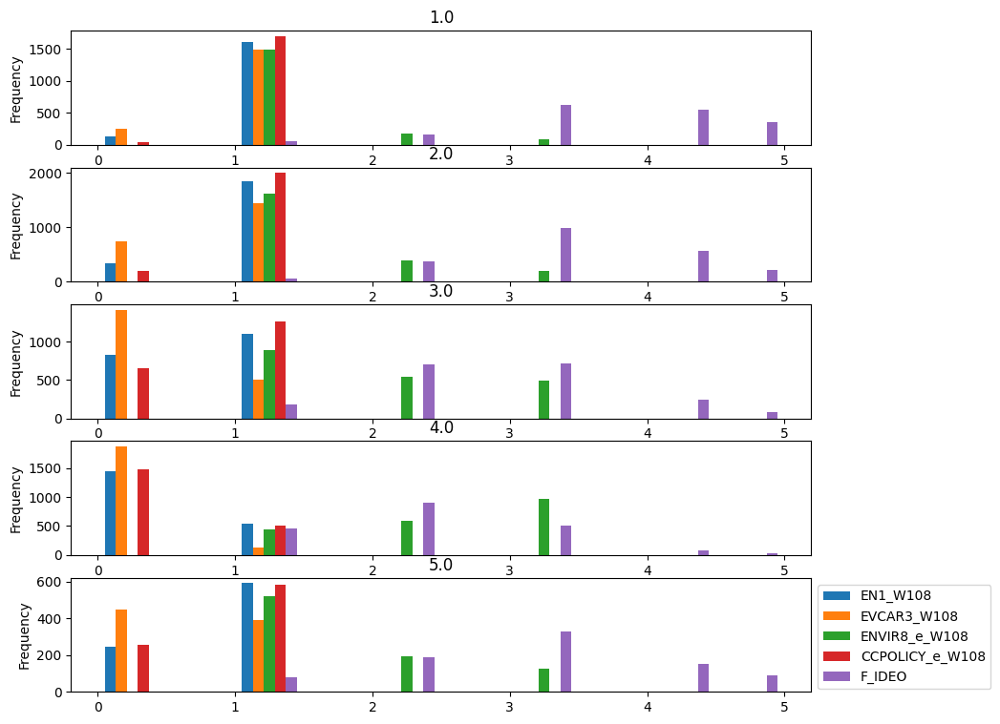

In [200]:
#plot histogram of moderate correlations variables for EVCAR2_W108
subset_df.plot(kind='hist',column=['EN1_W108', 'EVCAR3_W108', 'ENVIR8_e_W108', 'CCPOLICY_e_W108', 'F_IDEO']
                  , by="EVCAR2_W108",figsize=(10, 9),legend=False)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

F IDEO looks like it is roughly normally distributed for all EVCAR2_W108 responses centered at around the 3rd answer. The rest of the parameters have mixed distributions for the EVCAR2_W108 choices, where one answer is favored over the other or visae versa or almost evenly distributed.

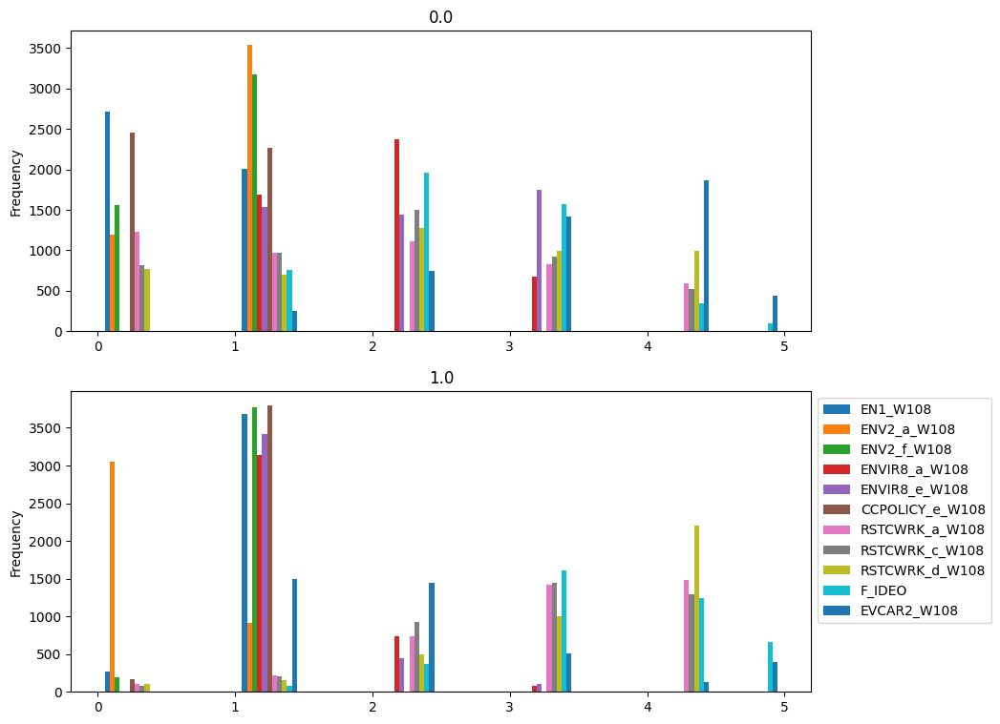

In [246]:
#plot histogram of moderate correlations variables for EVCAR3_W108
subset_df.plot(kind='hist',column=['EN1_W108', 'ENV2_a_W108', 'ENV2_f_W108', 'ENVIR8_a_W108',
                                   'ENVIR8_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108',
                                   'RSTCWRK_c_W108','RSTCWRK_d_W108','F_IDEO','EVCAR2_W108']
                  , by="EVCAR3_W108",figsize=(10, 9),legend=False)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

EVCAR3_W108 cooresponds to phasing out production of gas car/trucks by 2035
ENV1_a_W108 and ENV2_a_W108 looks like they are oppositely correlated with the response to EVCAR3_W108. ie if one opposes the other agrees
Those who favor phasing out gas car/trucks tend to be less conservative than those who oppose and more likely to get an ev for their next car (EVCAR2_W108). 

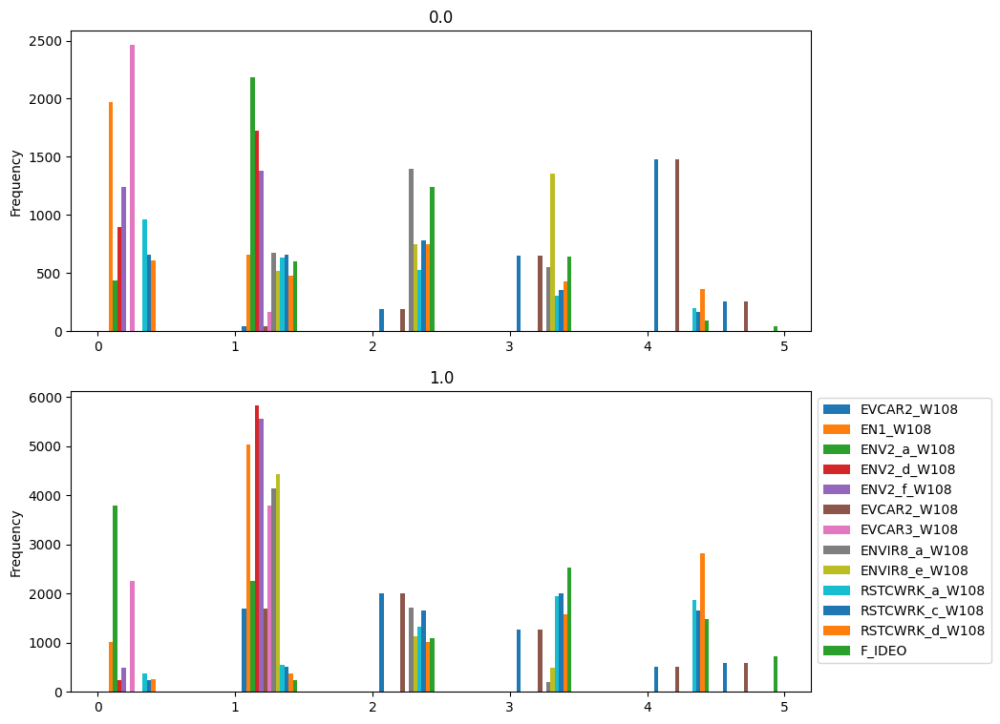

In [247]:
#plot histogram of moderate correlations variables for CCPOLICY_e_W108 for values >0.4 & EVCAR2_W108
subset_df.plot(kind='hist',column=['EVCAR2_W108','EN1_W108', 'ENV2_a_W108', 'ENV2_d_W108', 'ENV2_f_W108',
                                   'EVCAR2_W108','EVCAR3_W108', 'ENVIR8_a_W108',
                                   'ENVIR8_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_c_W108',
                                   'RSTCWRK_d_W108','F_IDEO']
                  , by="CCPOLICY_e_W108",figsize=(10, 9),legend=False,)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

CCPOLICY_e_W108 pertains to providing incentives to increase the use of hybrid and electric vehicles
It appears that those who oppose providing incentives are more conservative in their politcal views (F_IDEO) and not likely EVCAR2_W102 (answers3&4)to buy an ev and favor more off shore drilling (ENV2_a_W108). Those who favor the incentives are less conservative, think that the covid vaccine was effective and more willing to consider buying an ev and less likely to favor more off shore drilling.
Both answers seem to favor more solar panel farms (EV2_d_W108) over oppose.

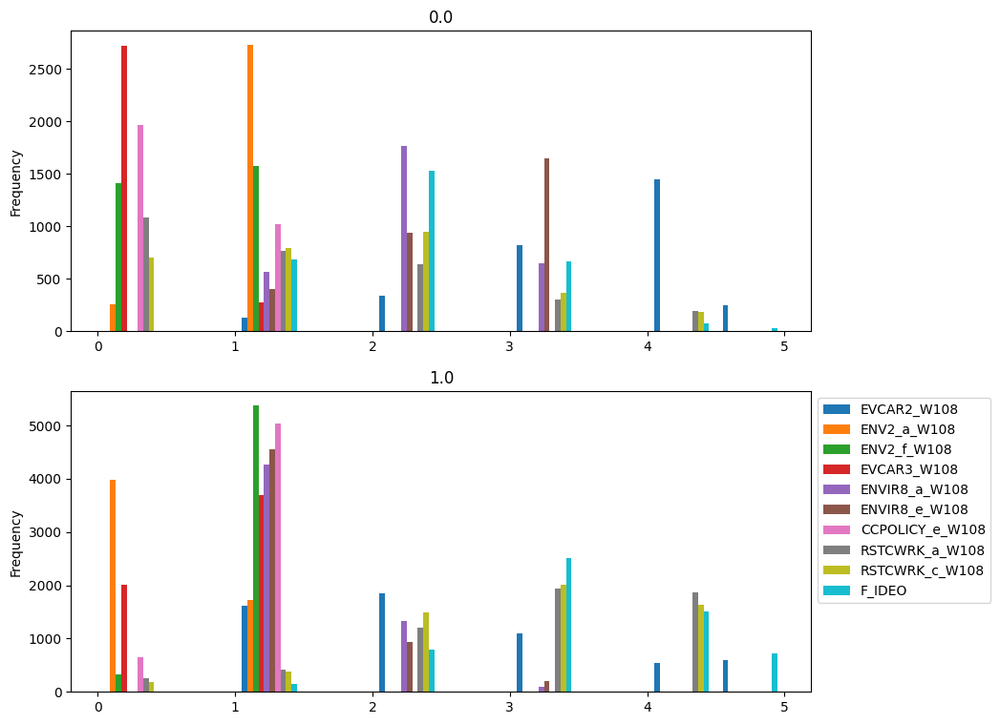

In [248]:
#plot histogram of moderate correlations variables for EN1_W108 with correlation > 0.45 and EVCAR2_W108
subset_df.plot(kind='hist',column=['EVCAR2_W108','ENV2_a_W108', 'ENV2_f_W108','EVCAR3_W108', 'ENVIR8_a_W108',
                                   'ENVIR8_e_W108', 'CCPOLICY_e_W108','RSTCWRK_a_W108', 'RSTCWRK_c_W108',
                                   'F_IDEO']
                  , by="EN1_W108",figsize=(10, 9),legend=False,)
#place legend outside figure
plt.legend(bbox_to_anchor=(1.0, 1.0))

EN1_W108 corresponds to types of sources of electricity/power.  
Those who favor C02 generating sources also tend to be more conserative, strongly oppose phasing out the production of new gas/trucks by 2035, think that the goverment is doing the about the right amount to reduce the effects of climate change and less likely to by an ev. While those who favor clean energy sources tend less conservative, slightly more likey to by an ev in their views and have the opposite views on the goverment action and phasing out cars

In [ ]:
#Copy is done to avoid modifying the original DataFrame when subsequent operations are 
#performed on the copied DataFrame.

subset_df = EV_df_original_1B

In [21]:
# list name of columns in subset dataframe
print(subset_df.columns.tolist())

['QKEY', 'ENV2_a_W108', 'ENV2_b_W108', 'ENV2_d_W108', 'ENV2_f_W108', 'EN1_W108', 'EVCAR2_W108', 'EVCAR3_W108', 'EVCAR1_W108', 'ENVIR8_a_W108', 'ENVIR8_e_W108', 'LOCENV_a_W108', 'LOCENV_d_W108', 'LOCENV_e_W108', 'ENVRMPCT_a_W108', 'ENVRMPCT_b_W108', 'ENVRMPCT_c_W108', 'ENVRMPCT_d_W108', 'ENVRMPCT_e_W108', 'CCPOLICY_e_W108', 'RSTCWRK_a_W108', 'RSTCWRK_b_W108', 'RSTCWRK_c_W108', 'RSTCWRK_d_W108', 'RSTCWRK_e_W108', 'COVID_INFECT_a_W108', 'COVID_INFECT_b_W108', 'GAP21Q12_W108', 'F_METRO', 'F_AGECAT', 'F_GENDER', 'F_EDUCCAT', 'F_PARTYSUM_FINAL', 'F_INC_SDT1', 'F_IDEO', 'F_INTFREQ', 'F_MARITAL_1.0', 'F_MARITAL_2.0', 'F_MARITAL_3.0', 'F_MARITAL_4.0', 'F_MARITAL_5.0', 'F_MARITAL_6.0', 'F_CREGION_1', 'F_CREGION_2', 'F_CREGION_3', 'F_CREGION_4', 'F_RACETHNMOD_1.0', 'F_RACETHNMOD_2.0', 'F_RACETHNMOD_3.0', 'F_RACETHNMOD_4.0', 'F_RACETHNMOD_5.0']


In [22]:
# shape of subset dataframe
subset_df.shape

(8684, 51)

In [ ]:
#X = subset_df[['EVCAR2_W108', 'EVCAR2B_a_W108', 'EVCAR2B_b_W108', 'EVCAR2B_c_W108','F_GENDER','F_AGECAT','F_EDUCCAT',
#               'F_RACETHNMOD','F_PARTYSUM_FINAL','F_MARITAL', 'F_CREGION',]]#,'F_METRO',

#taking most of the columns in the data set
X = subset_df.drop(['F_METRO','QKEY',], axis=1)
#y = subset_df[['F_AGECAT']].values.reshape(-1,)
y = subset_df[['F_METRO']].values.reshape(-1,)
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)
data = [X_train_scaled, X_test_scaled, y_train, y_test]

In [ ]:
print(X.columns.tolist())

# Data Implementation:  Supervised Learning
## Why?
## Analyses to help answer and predict why consumers intend to purchase or have purchased an electric vehicle/EV

In [ ]:
# Create a StandardScater model and fit it to the training data
X_scaler = StandardScaler()
X_scaler.fit(X_train)

In [ ]:
# Transform the training and testing data by using the X_scaler model
X_train_scaled = X_scaler.transform(X_train)
X_test_scaled = X_scaler.transform(X_test)

k: 1, Train/Test Score: 1.000/0.818
k: 3, Train/Test Score: 0.899/0.859
k: 5, Train/Test Score: 0.887/0.877
k: 7, Train/Test Score: 0.884/0.879
k: 9, Train/Test Score: 0.882/0.879
k: 11, Train/Test Score: 0.881/0.881
k: 13, Train/Test Score: 0.881/0.881
k: 15, Train/Test Score: 0.881/0.882
k: 17, Train/Test Score: 0.881/0.882
k: 19, Train/Test Score: 0.880/0.882


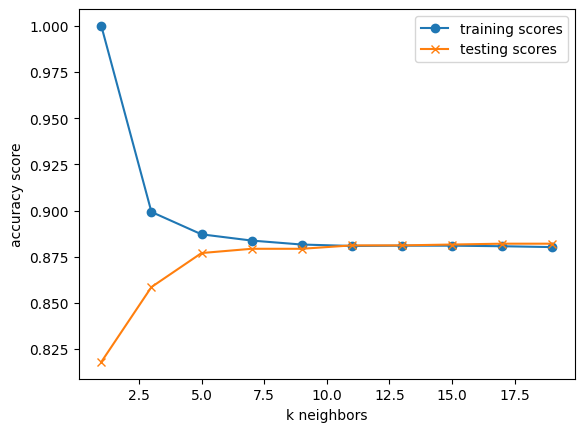

In [28]:
# Loop through different k values to find which has the highest accuracy.
# Note: We use only odd numbers because we don't want any ties.
train_scores = []
test_scores = []
for k in range(1, 20,2):
    knn = KNeighborsClassifier(n_neighbors=k)#, p=5)
    knn.fit(X_train_scaled, y_train)
    train_score = knn.score(X_train_scaled, y_train)
    test_score = knn.score(X_test_scaled, y_test)
    train_scores.append(train_score)
    test_scores.append(test_score)
    print(f"k: {k}, Train/Test Score: {train_score:.3f}/{test_score:.3f}")
    
# Plot the results
plt.plot(range(1, 20, 2), train_scores, marker='o', label="training scores")
plt.plot(range(1, 20, 2), test_scores, marker="x", label="testing scores")
plt.xlabel("k neighbors")
plt.ylabel("accuracy score")
plt.legend()
plt.show()

In [29]:
# Train the KNN model with the best k value
best_k_value =5
knn = KNeighborsClassifier(n_neighbors=best_k_value)
knn.fit(X_train_scaled, y_train)
print(f'k={best_k_value} Test Acc: {round(knn.score(X_test_scaled, y_test),3)}')

k=5 Test Acc: 0.877


In [30]:
knn_predict = knn.predict(X_test_scaled)

In [31]:
target_names= ['Non-metropolitan','Metropolitan' ]
print(classification_report(y_test, knn_predict,target_names=target_names))

                  precision    recall  f1-score   support

Non-metropolitan       0.40      0.07      0.12       258
    Metropolitan       0.89      0.99      0.93      1913

        accuracy                           0.88      2171
       macro avg       0.65      0.53      0.53      2171
    weighted avg       0.83      0.88      0.84      2171



In [32]:
print(confusion_matrix(y_test, knn_predict, labels = [0,1]))

[[  19  239]
 [  28 1885]]


<Axes: xlabel='F_INC_SDT1', ylabel='F_AGECAT'>

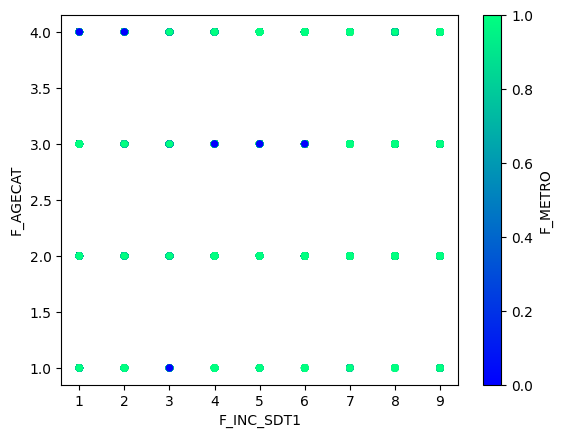

In [33]:
# Plot the data points 
subset_df.plot.scatter(
    x="F_INC_SDT1", 
    y="F_AGECAT",
    c="F_METRO", 
    colormap='winter')

not very intresting as the metro and non-metro fall on top of each other

Text(0.5, 0, 'response')

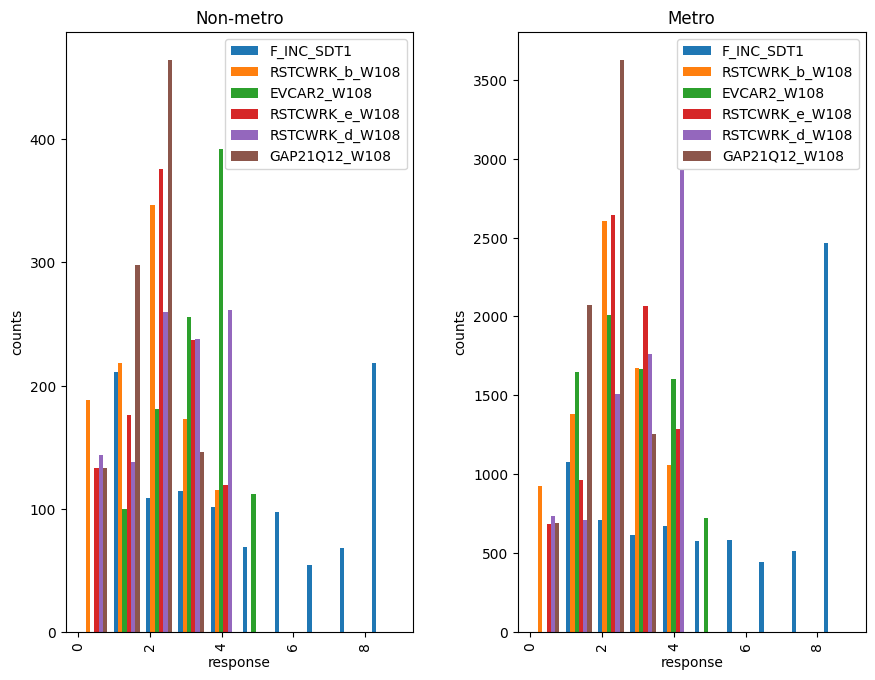

In [34]:
# plotting histograms most important features
ax=subset_df.hist(column=['F_INC_SDT1', 'RSTCWRK_b_W108', 'EVCAR2_W108', 'RSTCWRK_e_W108', 'RSTCWRK_d_W108', 
                          'GAP21Q12_W108'], by="F_METRO", figsize=(10, 8),legend=True)
ax[1].set_title("Metro")
ax[0].set_ylabel("counts")
ax[0].set_xlabel("response")
ax[0].set_title("Non-metro")
ax[1].set_ylabel("counts")
ax[1].set_xlabel("response")

most important features appear somewhat as normal distributions expect for F_INT_SDT1 

Text(0.5, 0, 'response')

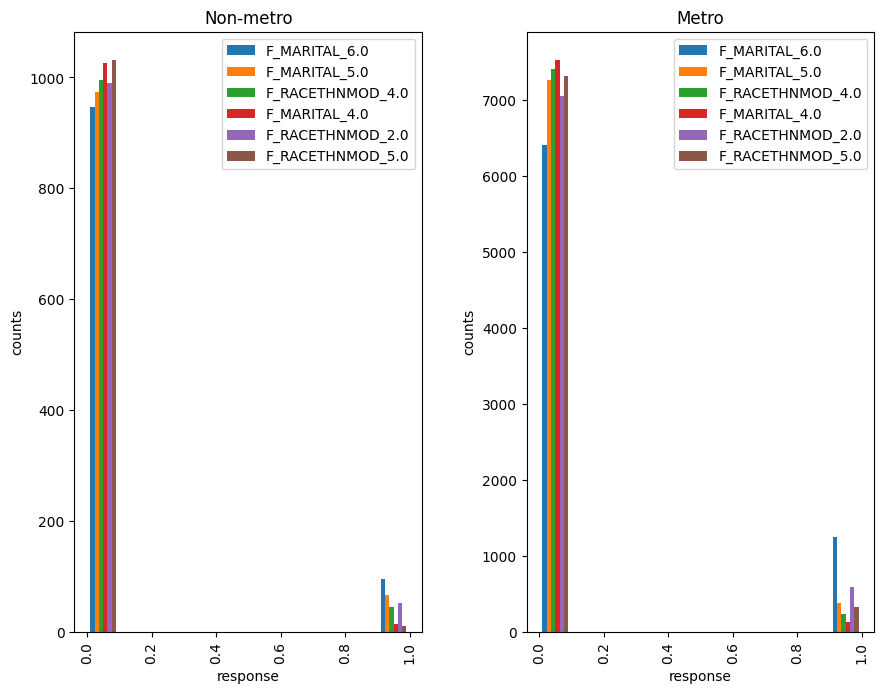

In [35]:
# plotting histograms least important features
ax=subset_df.hist(column=['F_MARITAL_6.0', 'F_MARITAL_5.0','F_RACETHNMOD_4.0', 'F_MARITAL_4.0', 'F_RACETHNMOD_2.0',
                          'F_RACETHNMOD_5.0'], by="F_METRO", figsize=(10, 8),legend=True)
ax[1].set_title("Metro")
ax[0].set_ylabel("counts")
ax[0].set_xlabel("response")
ax[0].set_title("Non-metro")
ax[1].set_ylabel("counts")
ax[1].set_xlabel("response")

least important features appear to be imbalanced

In [36]:
# Create the decision tree classifier instance
treemodel = tree.DecisionTreeClassifier(criterion='gini')#  'gini', 'log_loss', 'entropy'

In [37]:
# Fit the model
treemodel = treemodel.fit(X_train_scaled, y_train)

In [38]:
# Making predictions using the testing data
tree_predictions = treemodel.predict(X_test)

In [39]:
# Calculate the accuracy score
tree_acc_score = accuracy_score(y_test, tree_predictions)

print(f"Accuracy Score : {tree_acc_score}")

Accuracy Score : 0.8811607554122525


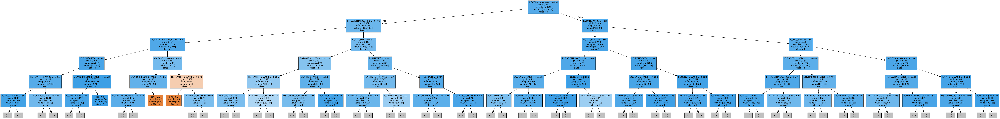

In [40]:
# Create DOT data
dot_data = tree.export_graphviz(
    treemodel, out_file=None, feature_names=X.columns, class_names=["0", "1"], filled=True, max_depth=5
)

# Draw graph
graph = pydotplus.graph_from_dot_data(dot_data)

# Show graph
Image(graph.create_png())

In [41]:
print(classification_report(y_test, tree_predictions, target_names=target_names))

                  precision    recall  f1-score   support

Non-metropolitan       0.00      0.00      0.00       258
    Metropolitan       0.88      1.00      0.94      1913

        accuracy                           0.88      2171
       macro avg       0.44      0.50      0.47      2171
    weighted avg       0.78      0.88      0.83      2171



In [42]:
# Train the Random Forest model
clf = RandomForestClassifier(random_state=1, n_estimators=8)

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=1)

# Scale the data
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [44]:
# Train the Random Forest model
clf =clf.fit(X_train_scaled, y_train)

# Evaluate the model
print(f'Training Score: {clf.score(X_train_scaled, y_train)}')
print(f'Testing Score: {clf.score(X_test_scaled, y_test)}')

Training Score: 0.9920159680638723
Testing Score: 0.8576692768309535


In [45]:
# Get the feature importance array
feature_importances = clf.feature_importances_

In [46]:
# sorting features by importance
importances_sorted = sorted(zip(feature_importances, X.columns), reverse=True)
importances_sorted[:]

[(0.06183490926313069, 'F_INC_SDT1'),
 (0.04113008961095188, 'RSTCWRK_b_W108'),
 (0.04033556701539351, 'EVCAR2_W108'),
 (0.04005031536550698, 'RSTCWRK_e_W108'),
 (0.037338398080703224, 'RSTCWRK_d_W108'),
 (0.037227644368909234, 'GAP21Q12_W108'),
 (0.03670379960999952, 'RSTCWRK_c_W108'),
 (0.036446639336079376, 'LOCENV_a_W108'),
 (0.03541583145161832, 'LOCENV_d_W108'),
 (0.03344834937707929, 'RSTCWRK_a_W108'),
 (0.03306493429321882, 'COVID_INFECT_b_W108'),
 (0.032980833647796144, 'COVID_INFECT_a_W108'),
 (0.03219708615587018, 'F_AGECAT'),
 (0.03182903109887833, 'LOCENV_e_W108'),
 (0.029414481142528537, 'F_IDEO'),
 (0.028952828898387527, 'F_EDUCCAT'),
 (0.028822430099175442, 'F_INTFREQ'),
 (0.024731541835445056, 'ENVIR8_e_W108'),
 (0.022175182941863734, 'ENVIR8_a_W108'),
 (0.02000772300131573, 'ENVRMPCT_c_W108'),
 (0.019189571894123524, 'F_GENDER'),
 (0.017435439743753715, 'F_CREGION_3'),
 (0.017204063395550195, 'F_CREGION_2'),
 (0.016995007364216882, 'ENVRMPCT_a_W108'),
 (0.016211811542

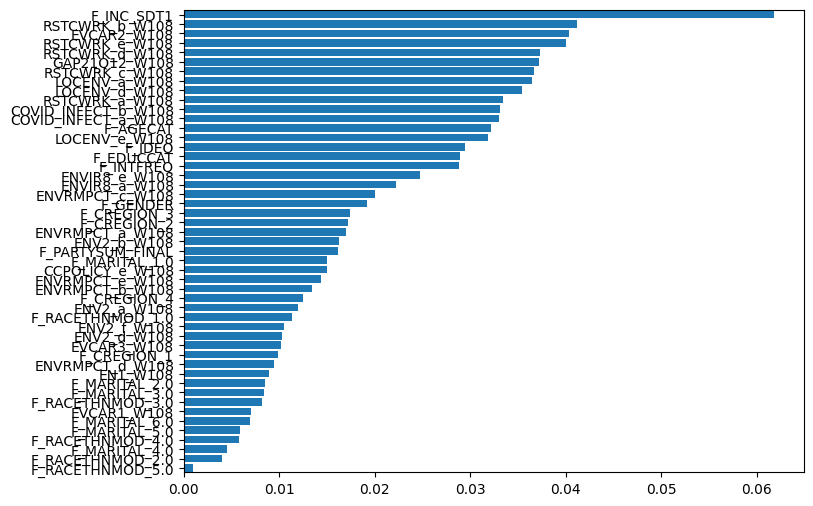

In [47]:
# Plot the feature importances
features = sorted(zip(X.columns, feature_importances), key = lambda x: x[1])
cols = [f[0] for f in features]
width = [f[1] for f in features]

fig, ax = plt.subplots()

fig.set_size_inches(8,6)
plt.margins(y=0.001)

ax.barh(y=cols, width=width)

plt.show()

In [48]:
clf_predict = clf.predict(X_test_scaled)

In [49]:
print(classification_report(y_test, clf_predict, target_names=target_names))

                  precision    recall  f1-score   support

Non-metropolitan       0.22      0.08      0.11       258
    Metropolitan       0.89      0.96      0.92      1913

        accuracy                           0.86      2171
       macro avg       0.55      0.52      0.52      2171
    weighted avg       0.81      0.86      0.83      2171



In [50]:
# checking svc model with different kernels
for kernel in ('rbf', 'linear','sigmoid'):
    for c in (0.00001,0.0001, 0.001, 0.01, 1):
        # Create the support vector machine classifier model with different kernels
        svcmodel = SVC(kernel=kernel, C=c,probability=True)
        svcmodel.fit(X_train, y_train)
        score = svcmodel.score(X_test, y_test)
        print( kernel, c, score)

rbf 1e-05 0.8811607554122525
rbf 0.0001 0.8811607554122525
rbf 0.001 0.8811607554122525
rbf 0.01 0.8811607554122525
rbf 1 0.8811607554122525
linear 1e-05 0.8811607554122525
linear 0.0001 0.8811607554122525
linear 0.001 0.8811607554122525
linear 0.01 0.8811607554122525
linear 1 0.8811607554122525
sigmoid 1e-05 0.8811607554122525
sigmoid 0.0001 0.8811607554122525
sigmoid 0.001 0.8811607554122525
sigmoid 0.01 0.8811607554122525
sigmoid 1 0.7977890373099954


In [51]:
# print score 
svcmodel = SVC(kernel='rbf', C=0.001)

In [52]:
# Split data into training and testing
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=4)

In [53]:
# Fit the model to the training data
svcmodel.fit(X_train, y_train)

SVC(C=0.001)

In [54]:
# Validate the model by checking the model accuracy with model.score
print('Train Accuracy: %.3f' % svcmodel.score(X_train, y_train))
print('Test Accuracy: %.3f' % svcmodel.score(X_test, y_test))

Train Accuracy: 0.878
Test Accuracy: 0.887


In [55]:
svc_predict = svcmodel.predict(X_test_scaled)

In [56]:
print(classification_report(y_test, svc_predict, target_names=target_names))

                  precision    recall  f1-score   support

Non-metropolitan       0.00      0.00      0.00       246
    Metropolitan       0.89      1.00      0.94      1925

        accuracy                           0.89      2171
       macro avg       0.44      0.50      0.47      2171
    weighted avg       0.79      0.89      0.83      2171



# Data Model Evalaution and Optimization:  Supervised Learning
## Analyses to assess various iterations of model performance

# Data Implementation:  Unsupervised Learning
## Who?  
## Principal components analysis and cluster analysis are used to refine our understanding of who intends to purchase or has purhcased an electric vehicle/EV


# Data Model Evalaution and Optimization:  Unsupervised Learning
## Analyses to assess various iterations of model performance